# Cycle 1

A. Image Negative
1. Implement the image negative transformation function and apply it to a grayscale image.
2. Analyze the effect of image negative on different types of images (e.g., low contrast, high
contrast).
3. Compare the histogram of an original image with its negative. Explain the observed
differences.


In [ ]:
# Repo with some images
!git clone "https://github.com/mohammadimtiazz/standard-test-images-for-Image-Processing.git"
!pip install opencv-python

Cloning into 'standard-test-images-for-Image-Processing'...
remote: Enumerating objects: 37, done.
remote: Total 37 (delta 0), reused 0 (delta 0), pack-reused 37 (from 1)
Receiving objects: 100% (37/37), 6.70 MiB | 16.49 MiB/s, done.
Resolving deltas: 100% (1/1), done.


In [ ]:
import cv2
import matplotlib.pyplot as plt

# Function to plot 2 images side by side
def plot_original_and_transformed(original, transformed,
                                  title_original="Original Image",
                                  title_transformed="Transformed Image",
                                  figsize=(10,5)):
    # Convert from BGR (OpenCV) to RGB (matplotlib)
    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    transformed_rgb = cv2.cvtColor(transformed, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=figsize)

    # Plot original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_rgb)
    plt.title(title_original)
    plt.axis('off')

    # Plot transformed image
    plt.subplot(1, 2, 2)
    plt.imshow(transformed_rgb)
    plt.title(title_transformed)
    plt.axis('off')

    plt.tight_layout()
    plt.show()

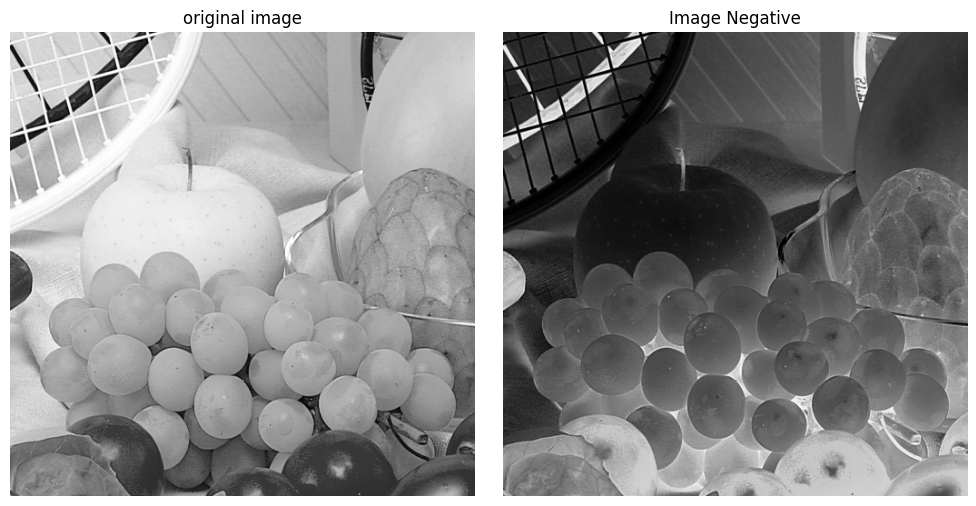

In [ ]:
# Implement the image negative transformation function and apply it to a grayscale image.

import cv2
import matplotlib.pyplot as plt

image_path = '/content/standard-test-images-for-Image-Processing/standard_test_images/fruits.png'

img = cv2.imread(image_path)
# Convert to RGB
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def get_img_negative(img):
  image_negative = cv2.cvtColor(255-img, cv2.COLOR_RGB2GRAY)
  return image_negative

image_negative = get_img_negative(img)

# Converting to grayscale for easier plotting
grayscale_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

plot_original_and_transformed(grayscale_img, image_negative,"original image", "Image Negative")



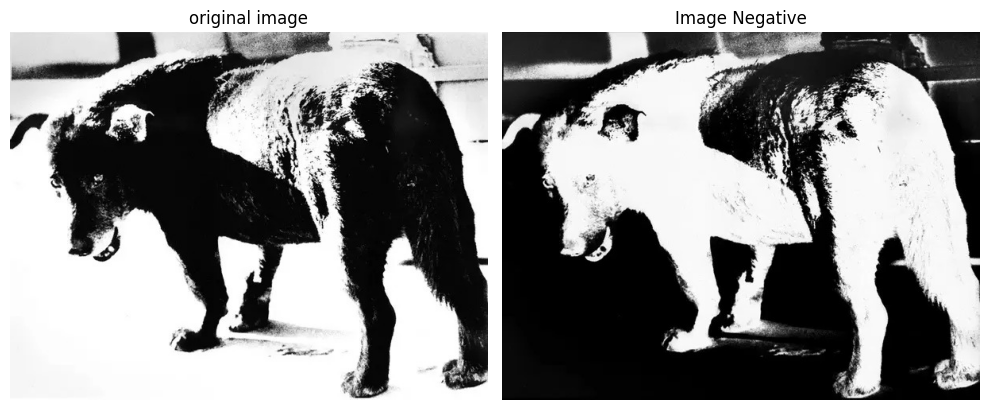

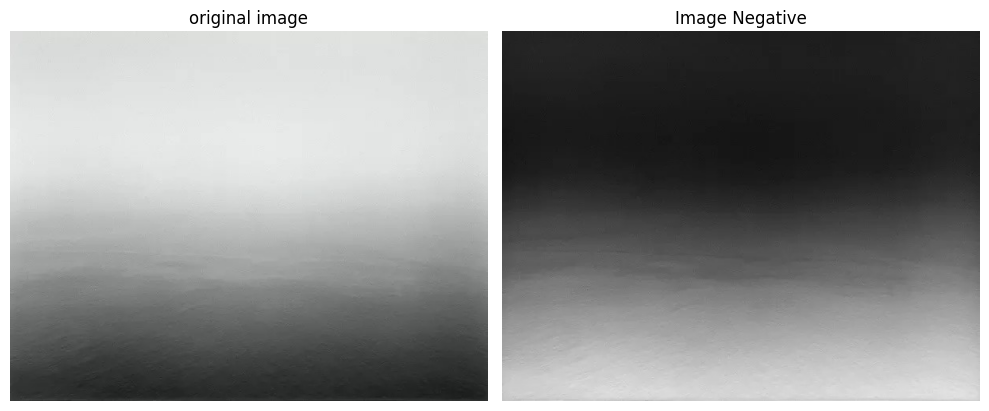

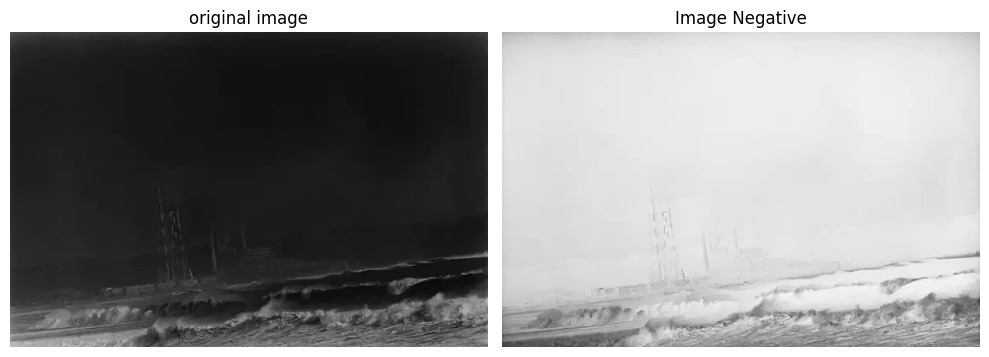

In [ ]:
# Q2 Analyze the effect of image negative on different types of images (e.g., low contrast, high contrast).

# High contrast image
img1 = cv2.imread('/content/dog.jpg')

neg_img1 = get_img_negative(img1)

# Low contrast image
img2 = cv2.imread('/content/land2.jpg')

neg_img2 = get_img_negative(img2)

img3 = cv2.imread('/content/land.jpg')

neg_img3 = get_img_negative(img3)

plot_original_and_transformed(img1, neg_img1,"original image", "Image Negative")

plot_original_and_transformed(img2, neg_img2,"original image", "Image Negative")

plot_original_and_transformed(img3, neg_img3,"original image", "Image Negative")

In [ ]:
def compare_histogram(img):
    # Step 1: Read the image in grayscale for a single-channel histogram
    img_neg = get_img_negative(img)

    # Step 2: Calculate the histogram

    # ranges = [0, 256] means we cover pixel intensities from 0 to 255
    hist_original = cv2.calcHist([img], [0], None, [256], [0, 256])
    hist_negative = cv2.calcHist([img_neg], [0], None, [256], [0, 256])

    fig, axs = plt.subplots(1, 2, figsize=(6, 4))
    axs = axs.ravel()



    # Original histogram
    axs[0].plot(hist_original, color='blue')
    axs[0].set_title("Histogram of Original")
    axs[0].set_xlim([0, 256])
    axs[0].set_xlabel("Intensity Value")
    axs[0].set_ylabel("Count")

    # Negative histogram
    axs[1].plot(hist_negative, color='red')
    axs[1].set_title("Histogram of Negative")
    axs[1].set_xlim([0, 256])
    axs[1].set_xlabel("Intensity Value")
    axs[1].set_ylabel("Count")

    plt.tight_layout()
    plt.show()

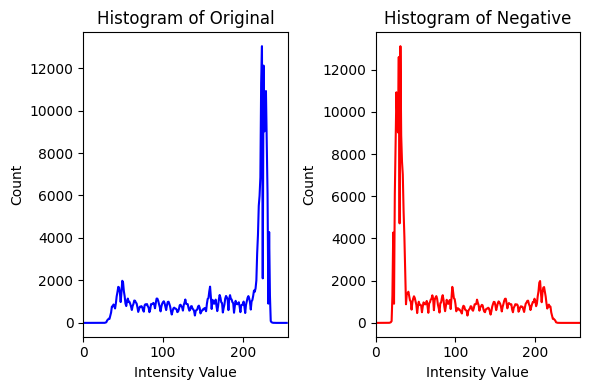

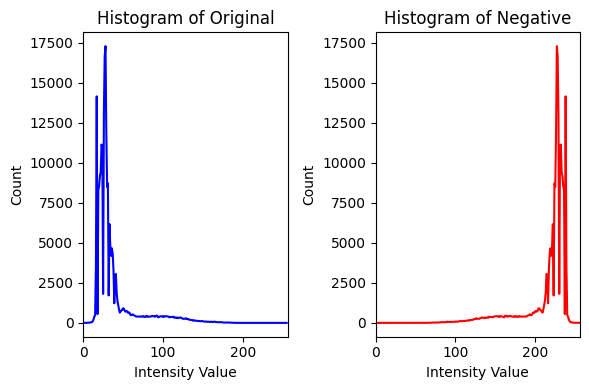

In [ ]:
compare_histogram(img2)
compare_histogram(img3)

B. Log Transformation
1. Implement the log transformation function and apply it to an image with a narrow range of
low gray-level values.
2. Analyze the effect of the log transformation on enhancing details in dark regions of an image.
3. Experiment with different values of the constant 'c' in the log transformation equation and
observe the changes in output image.

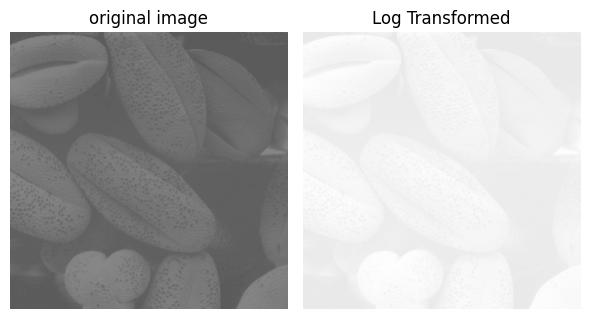

<ipython-input-39-b98a4e8699b4>:8: RuntimeWarning: divide by zero encountered in log
  log_transformed = c * np.log(1 + img)
<ipython-input-39-b98a4e8699b4>:23: RuntimeWarning: invalid value encountered in cast
  plot_original_and_transformed(aerial_img, log_img_a.astype(np.uint8),"original image", "Log Transformed",figsize=(6,4))


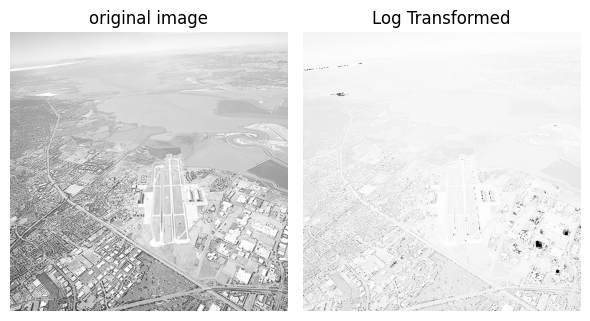

In [ ]:

import numpy as np

# Q1 Implement the log transformation function and apply it to an image with a narrow range of low gray-level values.

def log_transformation(img, c = None):
	if not c:
		c = 255 / (np.log(1 + np.max(img)))
	log_transformed = c * np.log(1 + img)
	return log_transformed

pollen_img = cv2.imread('/content/washed_out_pollen.tif')
pollen_img = cv2.cvtColor(pollen_img, cv2.COLOR_BGR2GRAY)

aerial_img = cv2.imread('/content/washed_out_aerial_image.tif')
aerial_img = cv2.cvtColor(aerial_img, cv2.COLOR_BGR2GRAY)

log_img_p = log_transformation(pollen_img)

plot_original_and_transformed(pollen_img, log_img_p.astype(np.uint8),"original image", "Log Transformed", figsize=(6,4))

log_img_a = log_transformation(aerial_img)

plot_original_and_transformed(aerial_img, log_img_a.astype(np.uint8),"original image", "Log Transformed",figsize=(6,4))



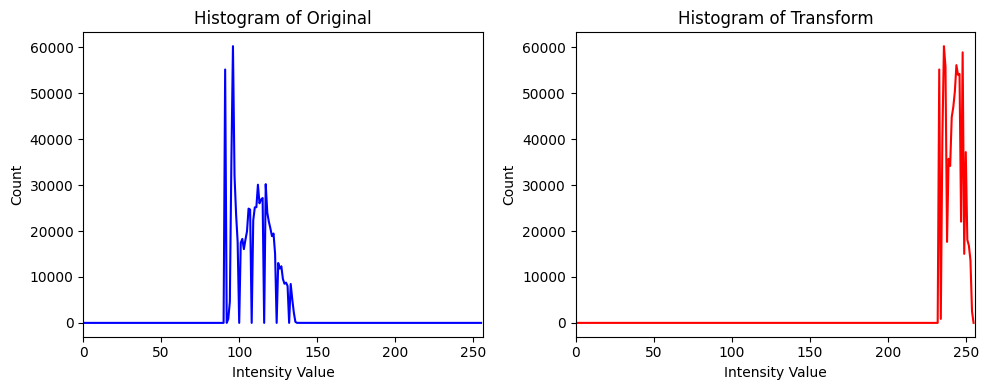

<ipython-input-47-ac6459570cf7>:34: RuntimeWarning: invalid value encountered in cast
  compare_histogram(aerial_img, log_img_a.astype(np.uint8))


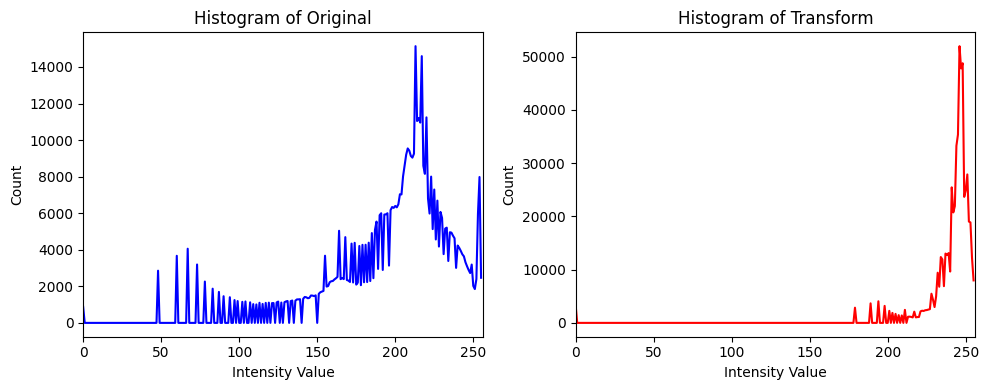

In [ ]:
# Q3 Analyze the effect of the log transformation on enhancing details in dark
# regions of an image.

def compare_histogram(img1,img2, caption1 = "Histogram of Original",
  caption2 = "Histogram of Transform"
  ):
    hist_original = cv2.calcHist([img1], [0], None, [256], [0, 256])
    hist_negative = cv2.calcHist([img2], [0], None, [256], [0, 256])

    fig, axs = plt.subplots(1, 2, figsize=(10, 4))
    axs = axs.ravel()



    # Original histogram
    axs[0].plot(hist_original, color='blue')
    axs[0].set_title(caption1)
    axs[0].set_xlim([0, 256])
    axs[0].set_xlabel("Intensity Value")
    axs[0].set_ylabel("Count")

    # Negative histogram
    axs[1].plot(hist_negative, color='red')
    axs[1].set_title(caption2)
    axs[1].set_xlim([0, 256])
    axs[1].set_xlabel("Intensity Value")
    axs[1].set_ylabel("Count")

    plt.tight_layout()
    plt.show()


compare_histogram(pollen_img, log_img_p.astype(np.uint8))
compare_histogram(aerial_img, log_img_a.astype(np.uint8))

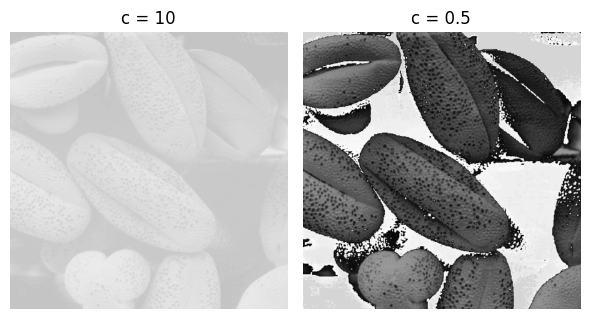

In [ ]:
# Q3 Experiment with different values of the constant 'c' in the log
# transformation equation and observe the changes in output image.

log_img_1 = log_transformation(pollen_img, 100
                               )
log_img_2 = log_transformation(pollen_img, 500)

plot_original_and_transformed(log_img_1.astype(np.uint8),
                              log_img_2.astype(np.uint8),"c = 100", "c = 500",
                              figsize=(6,4))


 Implement the power-law transformation function with different values of gamma.
1. Apply the power-law transformation to enhance images with different contrast
characteristics.
2. Analyze the effect of gamma values on the image appearance, especially for values less
than and greater than 1.
2. Experiment with different image types (e.g., medical, satellite, natural) to observe the
impact of transformations

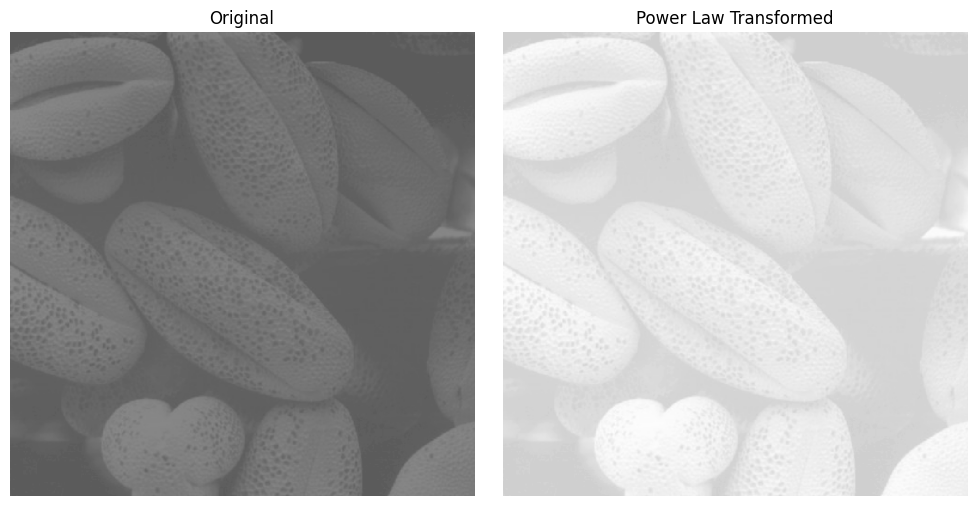

In [ ]:
# Q1 Apply the power-law transformation to enhance images with different
# contrast characteristics.

pollen_img = cv2.imread('/content/washed_out_pollen.tif')
pollen_img = cv2.cvtColor(pollen_img, cv2.COLOR_BGR2GRAY)

aerial_img = cv2.imread('/content/washed_out_aerial_image.tif')
aerial_img = cv2.cvtColor(aerial_img, cv2.COLOR_BGR2GRAY)

def power_law_transformation(img, gamma, c = None):
  # S = T(r) = c * r ** (gamma)

  if not c:
    c = 255 / (np.max(img) ** gamma)
  return c * np.power(img, gamma)

pl_1 = power_law_transformation(pollen_img, 0.5)
plot_original_and_transformed(pollen_img, pl_1.astype(np.uint8), "Original",
                              "Power Law Transformed")


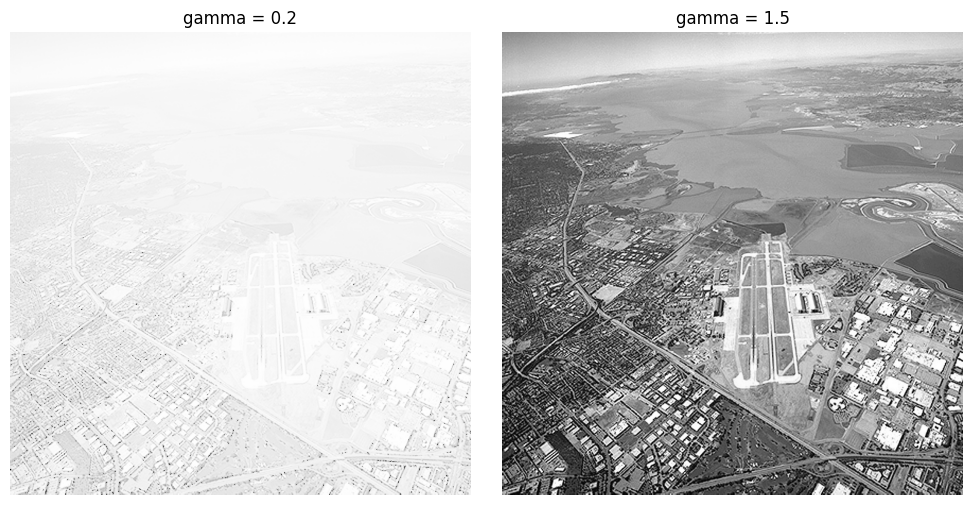

In [ ]:
# Q2 Analyze the effect of gamma values on the image appearance, especially for
# values less than and greater than 1.

gl1 = power_law_transformation(aerial_img, 0.2)
gl2 = power_law_transformation(aerial_img, 2.5)

plot_original_and_transformed(gl1.astype(np.uint8), gl2.astype(np.uint8),
                              "gamma = 0.2", "gamma = 1.5")


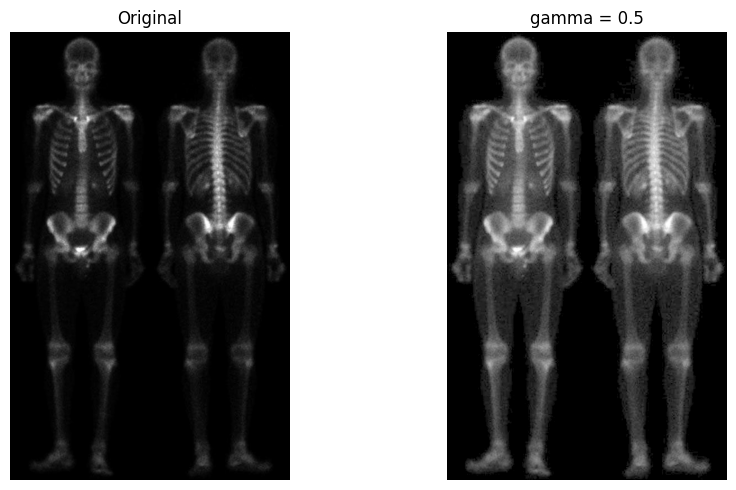

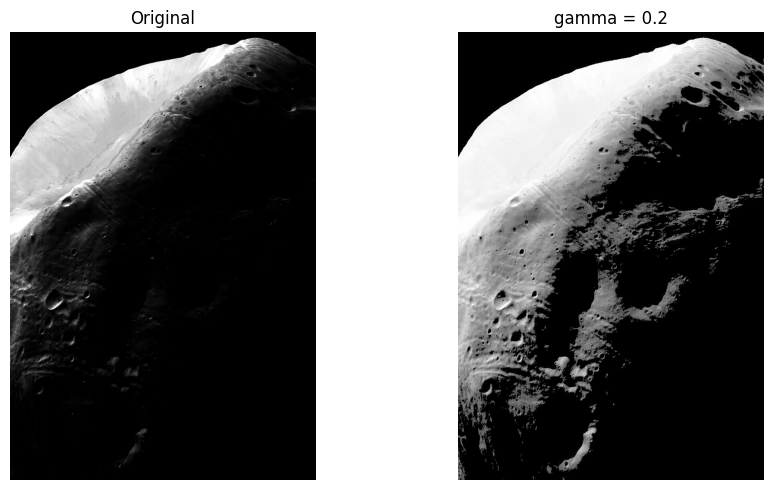

1. Implement mean, median, and Gaussian filters. Apply them to images with different
noise types (salt-and-pepper, Gaussian) and compare the results.
2. Design a custom filter for sharpening edges while preserving image details. Apply it
to a natural image and evaluate its performance.
3. Experiment with different Laplacian operators (4-connected, 8-connected) and
compare their edge detection capabilities.

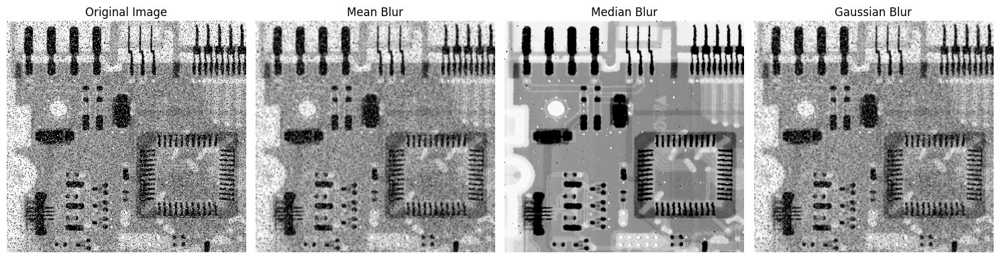

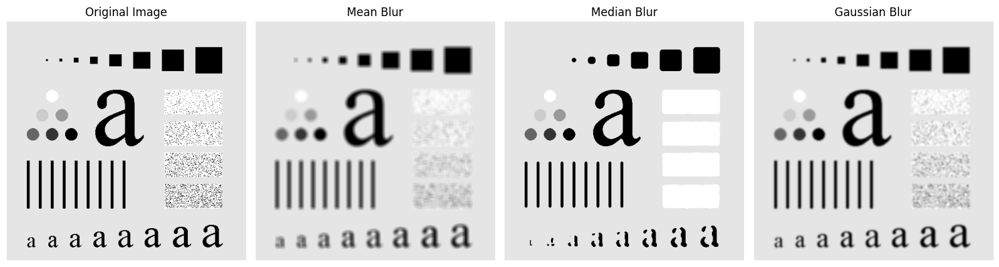

In [ ]:
'''
Implement mean, median, and Gaussian filters. Apply them to images with
different noise types (salt-and-pepper, Gaussian) and compare the results.
'''
import cv2
import numpy as np
import matplotlib.pyplot as plt

def four_image_compare(orig, mean, med, gauss):
    """
    Display four images side by side for comparison.
    - orig: Original image
    - mean: Image with mean blur applied
    - med: Image with median blur applied
    - gauss: Image with Gaussian blur applied
    """
    plt.figure(figsize=(15, 5))  # Adjust figure size to fit four images

    # Original Image
    plt.subplot(1, 4, 1)
    plt.imshow(orig, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    # Mean Blur
    plt.subplot(1, 4, 2)
    plt.imshow(mean, cmap='gray')
    plt.title("Mean Blur")
    plt.axis('off')

    # Median Blur
    plt.subplot(1, 4, 3)
    plt.imshow(med, cmap='gray')
    plt.title("Median Blur")
    plt.axis('off')

    # Gaussian Blur
    plt.subplot(1, 4, 4)
    plt.imshow(gauss, cmap='gray')
    plt.title("Gaussian Blur")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

def apply_mean_filter_img(img, kernel_size=3):
    """Apply mean filter (average blur) to an image."""
    return cv2.blur(img, (kernel_size, kernel_size))

def apply_median_filter_img(img, kernel_size=3):
    """Apply median filter to an image."""
    return cv2.medianBlur(img, kernel_size)

def apply_gaussian_filter_img(img, kernel_size=3):
    """Apply Gaussian blur to an image."""
    if kernel_size % 2 == 0:  # Ensure kernel size is odd
        kernel_size += 1
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

# Read and preprocess the first image
img1 = cv2.imread('/content/ck_pattern.tif')
if img1 is None:
    raise FileNotFoundError("Image '/content/ck_pattern.tif' not found!")
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)

# Apply filters
mean_img1 = apply_mean_filter_img(img1)
med_img1 = apply_median_filter_img(img1)
gauss_img1 = apply_gaussian_filter_img(img1)

# Compare results
four_image_compare(img1, mean_img1, med_img1, gauss_img1)

# Read and preprocess the second image
img2 = cv2.imread('/content/test_pattern_blurring_orig (1).tif')
mean_img2 = apply_mean_filter_img(img2,9)
med_img2 = apply_median_filter_img(img2,9)
gauss_img2 = apply_gaussian_filter_img(img2,9)

# Compare results
four_image_compare(img2, mean_img2, med_img2, gauss_img2)






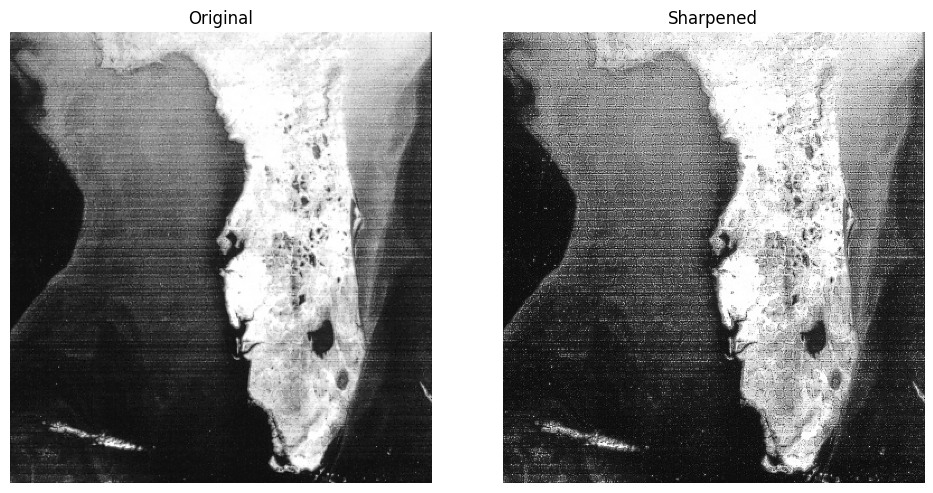

In [ ]:
'''
Design a custom filter for sharpening edges while preserving image details.
Apply it to a natural image and evaluate its performance.'''

def apply_custom_filter_img(img, filter):
    """Apply a custom filter to enhance edges while preserving details."""
    return cv2.filter2D(img, -1, filter)

image_nat = cv2.imread('/content/satellite_original.tif')
image_nat = cv2.cvtColor(image_nat, cv2.COLOR_BGR2GRAY)

laplacian_filter = np.array([[0, -1, 0],[-1, 5, -1],[0, -1, 0]])
sharpened_img = apply_custom_filter_img(image_nat, laplacian_filter)


plot_original_and_transformed(image_nat, sharpened_img, "Original",
                              "Sharpened")

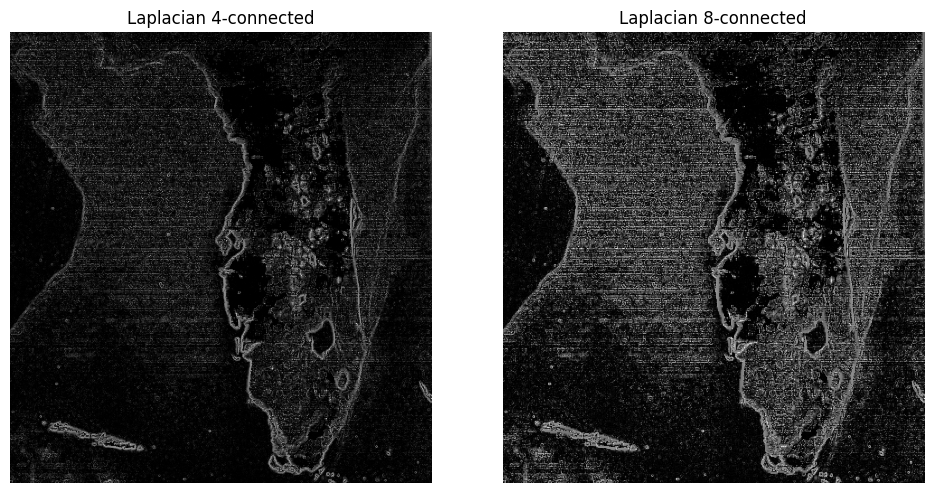

In [ ]:
'''
Experiment with different Laplacian operators (4-connected, 8-connected)
and compare their edge detection capabilities.
'''

lap_4_conn = np.array(np.array([[0, 1, 0],[1, -4, 1],[0, 1, 0]]))
lap_8_conn = np.array(np.array([[1, 1, 1],[1, -8, 1],[1,1,1]]))

lap_4_conn_img = apply_custom_filter_img(image_nat, lap_4_conn)
lap_8_conn_img = apply_custom_filter_img(image_nat, lap_8_conn)

plot_original_and_transformed(lap_4_conn_img, lap_8_conn_img,
                              "Laplacian 4-connected",
                              "Laplacian 8-connected")


# Image Transforms

1. Implement image subtraction to detect changes between two images (e.g, before and
after an event).
2. Create a simple image watermarking system using image addition and subtraction.
3. Experiment with image averaging to reduce noise in a sequence of images.

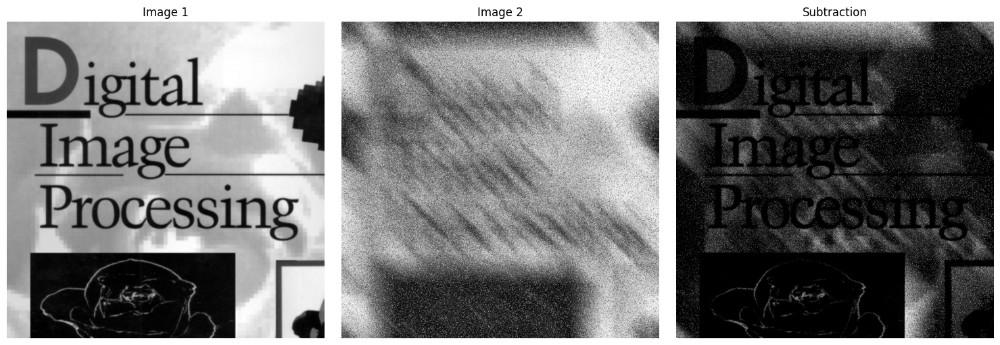

In [ ]:

def image_subtract(image1,image2):
  return cv2.subtract(image1, image2)

def three_image_compare(im1, im2, diff):
    """
    Display four images side by side for comparison.
    - orig: Original image
    - mean: Image with mean blur applied
    - med: Image with median blur applied
    - gauss: Image with Gaussian blur applied
    """
    plt.figure(figsize=(15, 5))  # Adjust figure size to fit four images

    # Original Image
    plt.subplot(1, 3, 1)
    plt.imshow(im1, cmap='gray')
    plt.title("Image 1")
    plt.axis('off')

    # Mean Blur
    plt.subplot(1, 3, 2)
    plt.imshow(im2, cmap='gray')
    plt.title("Image 2")
    plt.axis('off')

    # Median Blur
    plt.subplot(1, 3, 3)
    plt.imshow(diff, cmap='gray')
    plt.title("Subtraction")
    plt.axis('off')

    plt.tight_layout()
    plt.show()


'''
Implement image subtraction to detect changes between two images
(e.g, before and after an event).
'''

orig_dip = cv2.imread('/content/orig_dip.tif')
orig_dip = cv2.cvtColor(orig_dip, cv2.COLOR_BGR2GRAY)

noisy_dip = cv2.imread('/content/noise_dip.tif')
noisy_dip = cv2.cvtColor(noisy_dip, cv2.COLOR_BGR2GRAY)

sub_img = image_subtract(orig_dip, noisy_dip)

three_image_compare(orig_dip, noisy_dip, sub_img)

Original image dimensions: 450x450
Padded image dimensions: 688x688
Padded image dimensions: 688x688


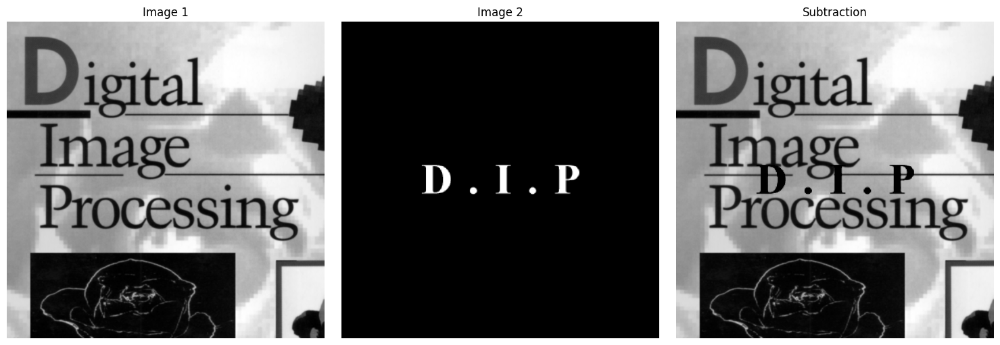

In [ ]:
'''
Create a simple image watermarking system using image addition and subtraction.
'''


# Pad the image to match og dimension

def pad_image_to_match(img, target_img, pad_color=0):
    # Get dimensions of both images
    h1, w1 = img.shape[:2]
    h2, w2 = target_img.shape[:2]

    # Calculate padding for each side
    top = (h2 - h1) // 2
    bottom = h2 - h1 - top
    left = (w2 - w1) // 2
    right = w2 - w1 - left

    # Check if padding is necessary (image must be smaller than target)
    if h1 > h2 or w1 > w2:
        raise ValueError("Target image must be larger than or equal to the input image.")

    # Apply padding
    padded_img = cv2.copyMakeBorder(img, top, bottom, left, right,
                                    cv2.BORDER_CONSTANT, value=pad_color)

    print(f"Original image dimensions: {h1}x{w1}")
    print(f"Padded image dimensions: {h2}x{w2}")
    print(f"Padded image dimensions: {padded_img.shape[0]}x{padded_img.shape[1]}")
    return padded_img

watermark_img = cv2.imread('/content/watermark_dip.tif')
watermark_img = cv2.cvtColor(watermark_img, cv2.COLOR_BGR2GRAY)

pad_watermark_img = pad_image_to_match(watermark_img,orig_dip)

sub_img = image_subtract(orig_dip, pad_watermark_img)
three_image_compare(orig_dip, pad_watermark_img, sub_img)

In [ ]:
import matplotlib.pyplot as plt

def plot_images(images, titles=None, figsize=(5, 5), cmap='gray'):
    num_images = len(images)
    if num_images == 0:
        raise ValueError("The images array is empty.")

    # Calculate grid size
    rows = int(num_images**0.5)
    cols = rows if rows * rows == num_images else rows + 1
    if rows * cols < num_images:
        cols += 1

    # Create figure
    plt.figure(figsize=figsize)

    for i, img in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        if cmap and len(img.shape) == 2:  # Grayscale image
            plt.imshow(img, cmap=cmap)
        else:  # Color image
            plt.imshow(img)

        if titles and i < len(titles):
            plt.title(titles[i])

        plt.axis('off')

    plt.tight_layout()
    plt.show()


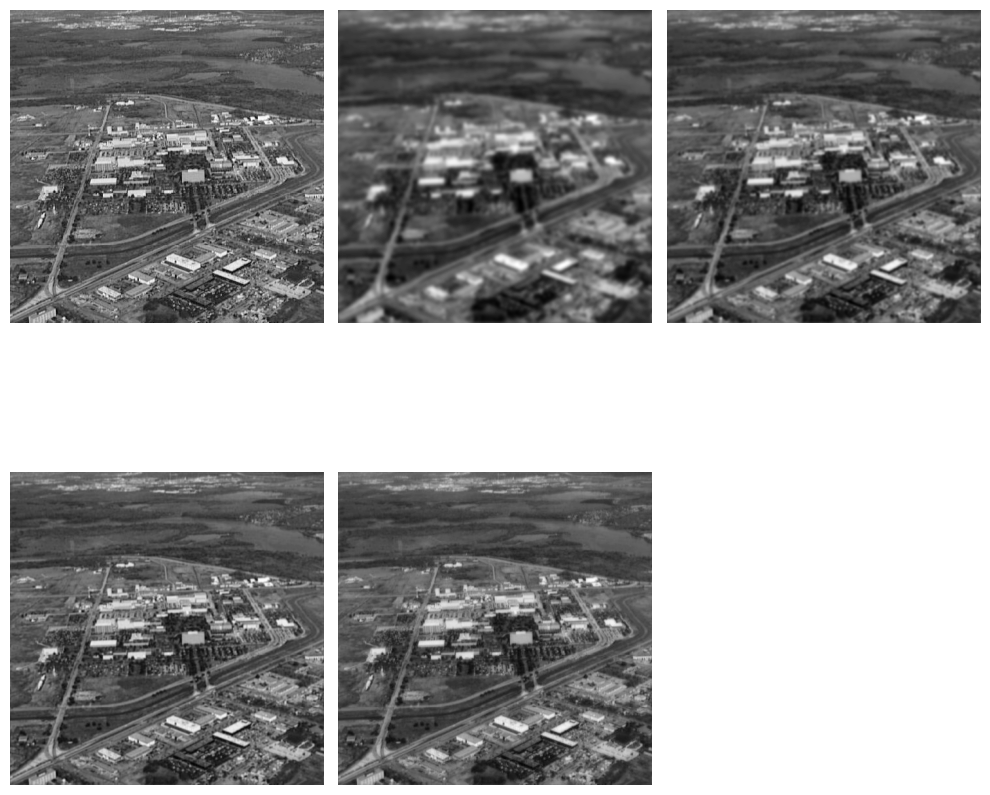

In [ ]:
'''Experiment with image averaging to reduce noise in a sequence of images.'''

import os

def average_images(imageList):
  size = imageList[0].shape
  average = np.zeros(size, dtype=np.float32)
  for img in imageList:
    average += img / len(imageList)
  return np.uint8(average)

images_folder = '/content/img_seq'

images_list = os.listdir(images_folder)

imageList = []

for img_name in images_list:
  img = cv2.imread(os.path.join(images_folder, img_name))
  img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  imageList.append(img)


avg_img = average_images(imageList)

imageList.append(avg_img)

plot_images(imageList, figsize=(10,10))





Perform Discrete Fourier Transform, Z- transform KL Transform on a gray scale image.

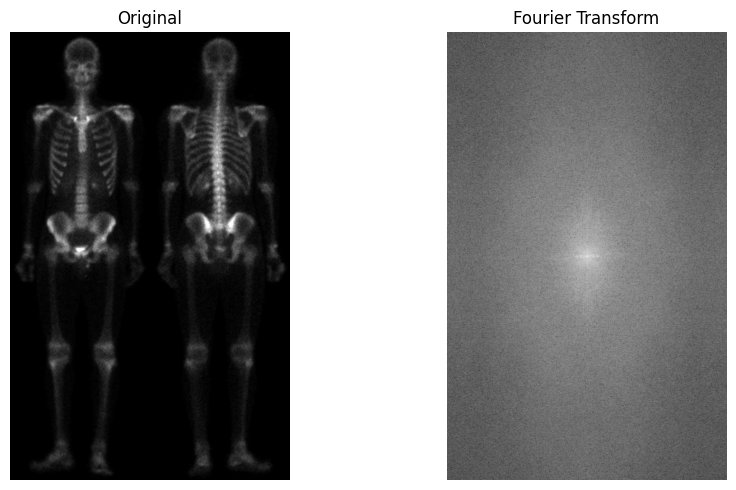

In [ ]:
image = cv2.imread('/content/skeleton.tif')
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

'''DFT'''
# Compute the discrete Fourier Transform of the image
fourier = cv2.dft(np.float32(gray), flags=cv2.DFT_COMPLEX_OUTPUT)

# Shift the zero-frequency component to the center of the spectrum
fourier_shift = np.fft.fftshift(fourier)

# calculate the magnitude of the Fourier Transform
magnitude = 20*np.log(cv2.magnitude(fourier_shift[:,:,0],fourier_shift[:,:,1]))

# Scale the magnitude for display
magnitude = cv2.normalize(magnitude, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8UC1)

plot_original_and_transformed(gray, magnitude, "Original", "Fourier Transform")

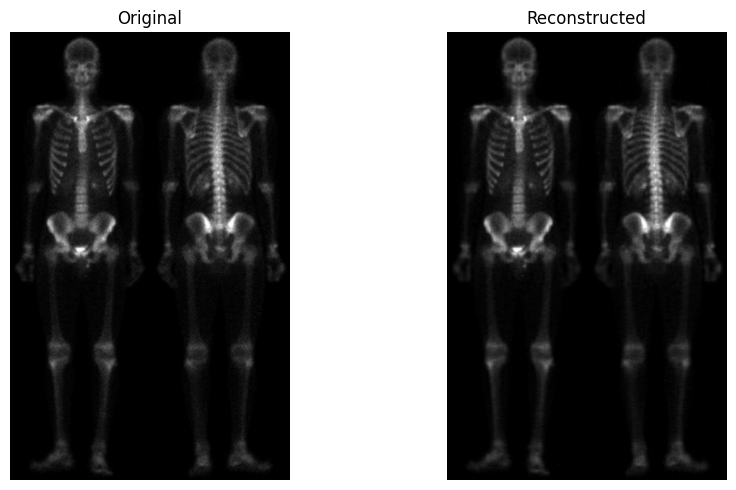

In [ ]:
'''
KL Transform
'''

import cv2
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt

# Read the image
image = cv2.imread('/content/skeleton.tif')

# Convert to grayscale
image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply PCA
original_shape = image.shape
flat_image = image.reshape(original_shape[0], -1)

# Apply PCA
pca = PCA(n_components=50)
transformed_data = pca.fit_transform(flat_image)

# Reconstruct the image
reconstructed_data = pca.inverse_transform(transformed_data)
reconstructed_image = reconstructed_data.reshape(original_shape)

# Convert the reconstructed image to uint8
reconstructed_image_uint8 = np.clip(reconstructed_image, 0, 255
                                    ).astype(np.uint8)
plot_original_and_transformed(image, reconstructed_image_uint8,
                              "Original", "Reconstructed")

# Histogram Equalization

1. Implement histogram equalization and matching on a grayscale image. Compare the
results visually and quantitatively using metrics like entropy.
2. Design a contrast enhancement technique for images with low contrast. Apply it to a
real-world image and evaluate its effectiveness.

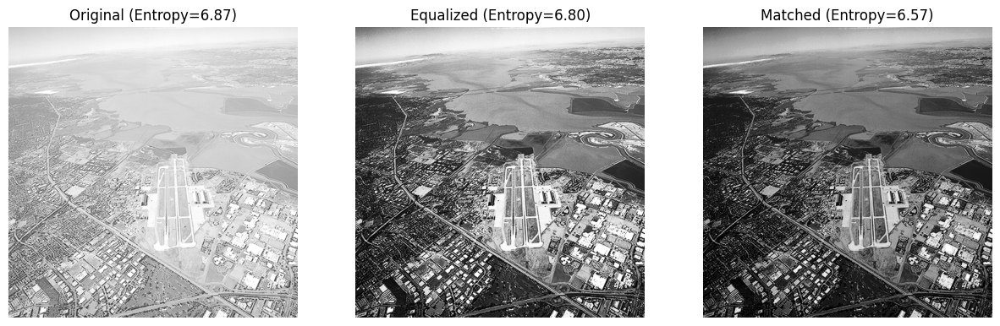

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.exposure import match_histograms
from skimage.measure import shannon_entropy

# Read the grayscale image
image = cv2.imread('/content/washed_out_aerial_image.tif', cv2.IMREAD_GRAYSCALE)

# Apply Histogram Equalization
equalized_image = cv2.equalizeHist(image)

# Histogram Matching with a reference image
reference_image = cv2.imread('/content/washed_out_pollen.tif', cv2.IMREAD_GRAYSCALE)
matched_image = match_histograms(image, reference_image)

# Calculate Entropy
def calculate_entropy(image):
    return shannon_entropy(image)

# Entropy of each image
original_entropy = calculate_entropy(image)
equalized_entropy = calculate_entropy(equalized_image)
matched_entropy = calculate_entropy(matched_image)

# Plot the results
def plot_images(original, enhanced1, enhanced2, titles):
    plt.figure(figsize=(15, 5))
    images = [original, enhanced1, enhanced2]
    for i in range(len(images)):
        plt.subplot(1, 3, i+1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i])
        plt.axis('off')
    plt.show()

plot_images(
    image,
    equalized_image,
    matched_image,
    [
        f'Original (Entropy={original_entropy:.2f})',
        f'Equalized (Entropy={equalized_entropy:.2f})',
        f'Matched (Entropy={matched_entropy:.2f})',
    ],
)


1. Implement the 2D Discrete Fourier Transform (DFT) and its inverse.
2. Design low-pass, high-pass, and band-pass filters in the frequency domain. Apply them
to an image and analyze the results.
3. Implement homomorphic filtering and apply it to an image with uneven illumination.

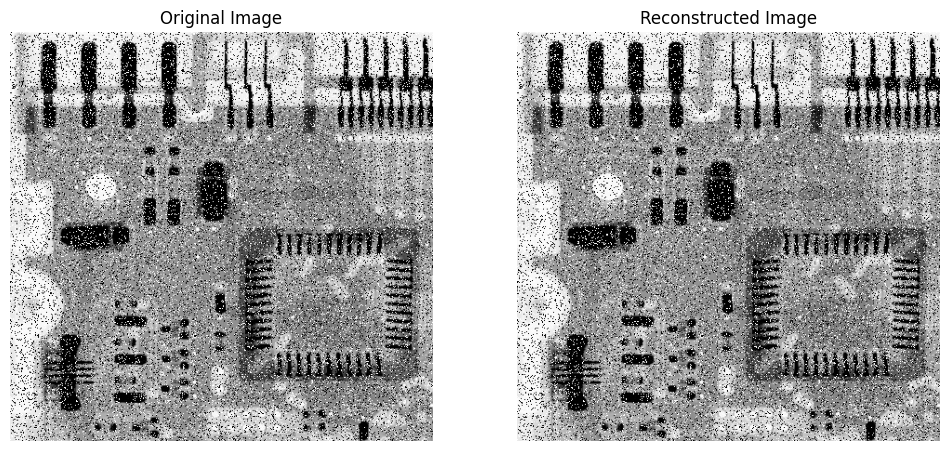

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

# Load the grayscale image
image = cv2.imread('/content/ck_pattern.tif', cv2.IMREAD_GRAYSCALE)

# Compute the 2D DFT
dft = np.fft.fft2(image)
dft_shifted = np.fft.fftshift(dft)
# Shift zero frequency component to the center

# Compute the inverse 2D DFT
idft_shifted = np.fft.ifftshift(dft_shifted)  # Inverse shift
reconstructed_image = np.fft.ifft2(idft_shifted)
reconstructed_image = np.abs(reconstructed_image)

# Function to display images
def display_images(images, titles):
    plt.figure(figsize=(12, 6))
    for i, (img, title) in enumerate(zip(images, titles)):
        plt.subplot(1, len(images), i + 1)
        plt.imshow(img, cmap='gray')
        plt.title(title)
        plt.axis('off')
    plt.show()

# Display original and reconstructed images
display_images([image, reconstructed_image], ['Original Image',
                                              'Reconstructed Image'])


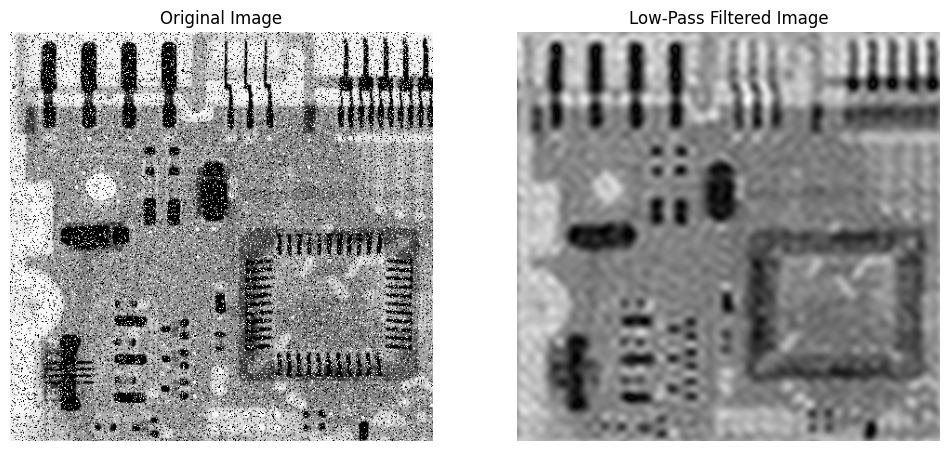

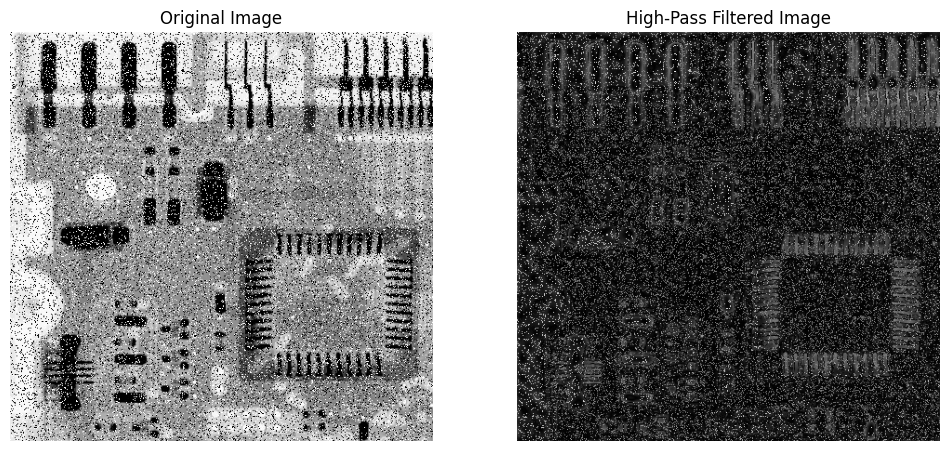

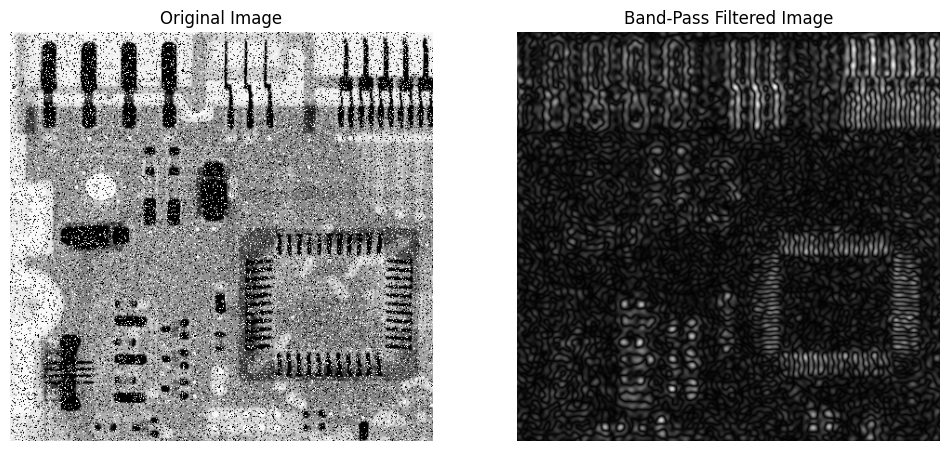

In [ ]:
def low_pass_filter(dft_shifted, cutoff):
    rows, cols = dft_shifted.shape
    crow, ccol = rows // 2 , cols // 2
    mask = np.zeros((rows, cols), np.uint8)
    mask[crow - cutoff:crow + cutoff, ccol - cutoff:ccol + cutoff] = 1
    return dft_shifted * mask

# Apply Low-Pass Filter
cutoff = 30  # Adjust cutoff frequency as needed
lpf_dft = low_pass_filter(dft_shifted, cutoff)
lpf_idft_shifted = np.fft.ifftshift(lpf_dft)
lpf_image = np.fft.ifft2(lpf_idft_shifted)
lpf_image = np.abs(lpf_image)

# Display Low-Pass Filtered Image
display_images([image, lpf_image], ['Original Image',
                                    'Low-Pass Filtered Image'])

def high_pass_filter(dft_shifted, cutoff):
    rows, cols = dft_shifted.shape
    crow, ccol = rows // 2 , cols // 2
    mask = np.ones((rows, cols), np.uint8)
    mask[crow - cutoff:crow + cutoff, ccol - cutoff:ccol + cutoff] = 0
    return dft_shifted * mask

# Apply High-Pass Filter
cutoff = 30  # Adjust cutoff frequency as needed
hpf_dft = high_pass_filter(dft_shifted, cutoff)
hpf_idft_shifted = np.fft.ifftshift(hpf_dft)
hpf_image = np.fft.ifft2(hpf_idft_shifted)
hpf_image = np.abs(hpf_image)

# Display High-Pass Filtered Image
display_images([image, hpf_image], ['Original Image',
                                    'High-Pass Filtered Image'])

def band_pass_filter(dft_shifted, low_cutoff, high_cutoff):
    rows, cols = dft_shifted.shape
    crow, ccol = rows // 2 , cols // 2
    mask = np.zeros((rows, cols), np.uint8)
    mask[crow - high_cutoff:crow + high_cutoff,
         ccol - high_cutoff:ccol + high_cutoff] = 1
    mask[crow - low_cutoff:crow + low_cutoff,
         ccol - low_cutoff:ccol + low_cutoff] = 0
    return dft_shifted * mask

# Apply Band-Pass Filter
low_cutoff = 20   # Adjust low cutoff frequency as needed
high_cutoff = 50  # Adjust high cutoff frequency as needed
bpf_dft = band_pass_filter(dft_shifted, low_cutoff, high_cutoff)
bpf_idft_shifted = np.fft.ifftshift(bpf_dft)
bpf_image = np.fft.ifft2(bpf_idft_shifted)
bpf_image = np.abs(bpf_image)

# Display Band-Pass Filtered Image
display_images([image, bpf_image], ['Original Image',
                                    'Band-Pass Filtered Image'])



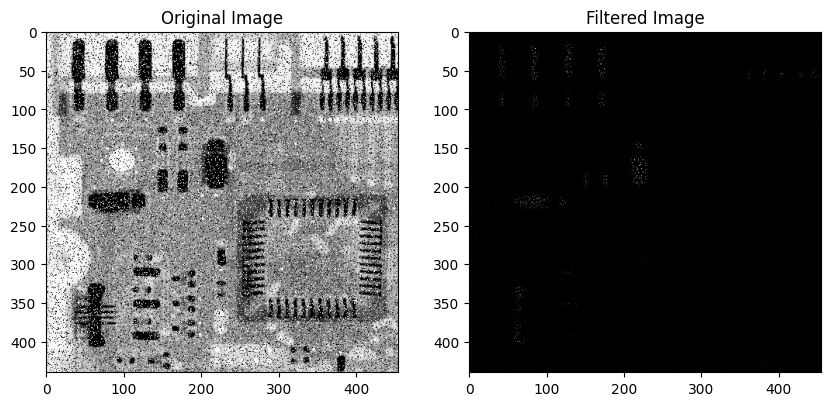

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
image = cv2.imread('/content/ck_pattern.tif',
                   cv2.IMREAD_GRAYSCALE)

# Step 1: Log transformation
image_log = np.log1p(np.array(image, dtype="float"))

# Step 2: Fourier Transform
fft = np.fft.fft2(image_log)
fft_shift = np.fft.fftshift(fft)

# Step 3: Create a high-pass filter
rows, cols = image.shape
crow, ccol = rows // 2, cols // 2
radius = 30  # Radius for the filter
gamma1 = 0.5  # Low-frequency gain
gamma2 = 2.0  # High-frequency gain

# Design a Gaussian high-pass filter
x, y = np.meshgrid(np.linspace(-ccol, ccol, cols),
                   np.linspace(-crow, crow, rows))
d = np.sqrt(x**2 + y**2)
high_pass_filter = 1 - np.exp(-(d**2 / (2 * (radius**2))))
filter = gamma1 + gamma2 * high_pass_filter

# Apply the filter
filtered_fft = fft_shift * filter

# Step 4: Inverse Fourier Transform
fft_inverse = np.fft.ifftshift(filtered_fft)
image_filtered_log = np.fft.ifft2(fft_inverse)
image_filtered_log = np.abs(image_filtered_log)

# Step 5: Exponential transformation
image_filtered = np.expm1(image_filtered_log)

# Normalize to display
image_filtered = cv2.normalize(image_filtered, None, 0, 255, cv2.NORM_MINMAX)
image_filtered = np.uint8(image_filtered)

# Display results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image, cmap='gray')
plt.subplot(1, 2, 2)
plt.title("Filtered Image")
plt.imshow(image_filtered, cmap='gray')
plt.show()


1. Implement color space conversions between RGB, HSI, and YCbCr color models.
2. Perform color histogram equalization on a color image and analyze the results.
3. Implement color edge detection using Sobel or Canny operators. **bold text**

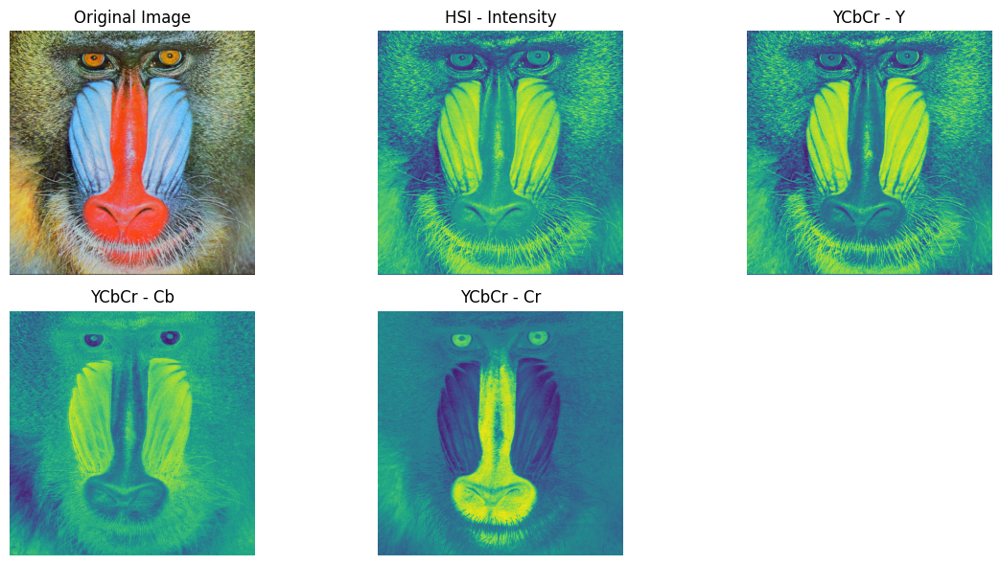

In [ ]:
'''
Implement color space conversions between RGB, HSI, and YCbCr color models.
'''

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to convert RGB to HSI
def rgb_to_hsi(image):
    image = image.astype('float') / 255
    r, g, b = cv2.split(image)
    num = 0.5 * ((r - g) + (r - b))
    den = np.sqrt((r - g)**2 + (r - b) * (g - b)) + 1e-6  # Avoid division by zero
    hue = np.arccos(num / den)
    hue[b > g] = 2 * np.pi - hue[b > g]
    hue = hue / (2 * np.pi)  # Normalize to [0, 1]
    sat = 1 - 3 * np.minimum(r, np.minimum(g, b)) / (r + g + b + 1e-6)
    intensity = (r + g + b) / 3
    return cv2.merge((hue, sat, intensity))

# Convert RGB to YCbCr using OpenCV
def rgb_to_ycbcr(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2YCrCb)

# Load an example image
image = cv2.imread('/content/standard-test-images-for-Image-Processing/standard_test_images/baboon.png')
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB for matplotlib

# RGB to HSI
hsi_image = rgb_to_hsi(image)
h, s, i = cv2.split(hsi_image)

# RGB to YCbCr
ycbcr_image = rgb_to_ycbcr(image)
y, cb, cr = cv2.split(ycbcr_image)

# Display Results
plt.figure(figsize=(12, 6))
plt.subplot(2, 3, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

plt.subplot(2, 3, 2)
plt.title('HSI - Intensity')
plt.imshow(i)
plt.axis('off')

plt.subplot(2, 3, 3)
plt.title('YCbCr - Y')
plt.imshow(y)
plt.axis('off')

plt.subplot(2, 3, 4)
plt.title('YCbCr - Cb')
plt.imshow(cb)
plt.axis('off')

plt.subplot(2, 3, 5)
plt.title('YCbCr - Cr')
plt.imshow(cr)
plt.axis('off')

plt.tight_layout()
plt.show()


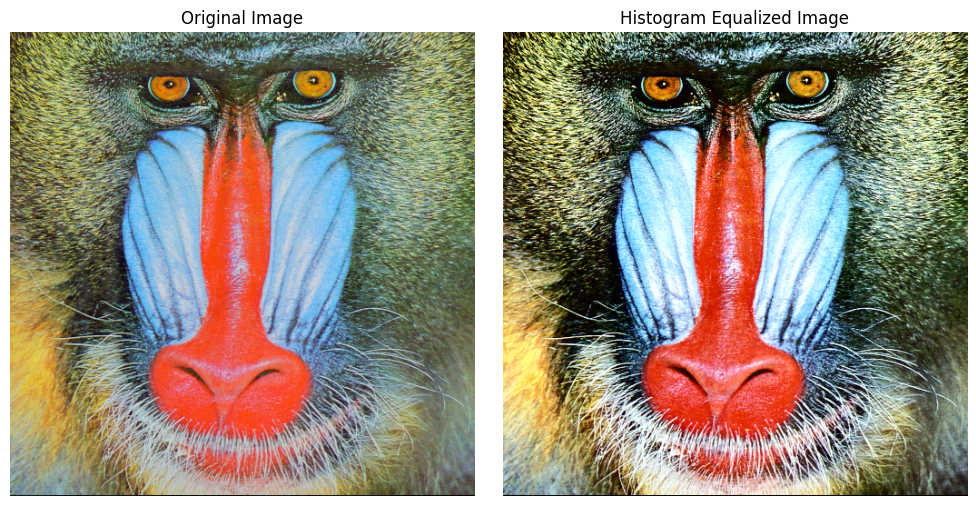

In [ ]:
def histogram_equalization_color(image):
    ycbcr = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)  # Input is already in RGB
    y, cb, cr = cv2.split(ycbcr)

    # Apply histogram equalization only on the luminance channel
    y_eq = cv2.equalizeHist(y)

    # Merge channels back
    ycbcr_eq = cv2.merge((y_eq, cb, cr))
    result = cv2.cvtColor(ycbcr_eq, cv2.COLOR_YCrCb2RGB)

    return result

# Perform Histogram Equalization
equalized_image = histogram_equalization_color(image)

# Compare Results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Histogram Equalized Image')
plt.imshow(equalized_image)
plt.axis('off')

plt.tight_layout()
plt.show()


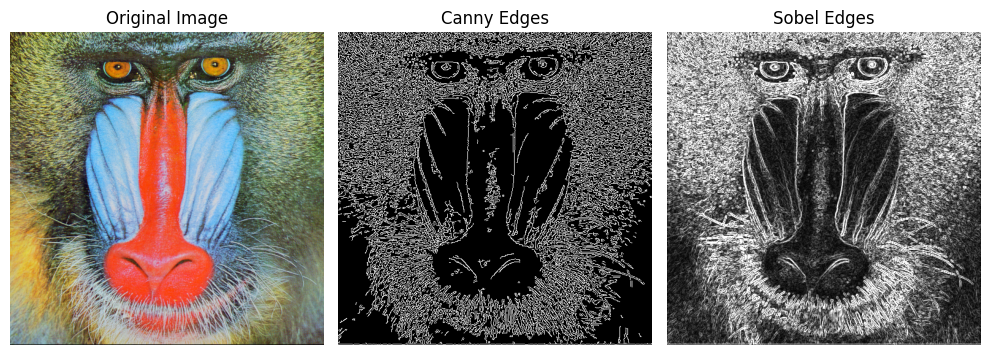

In [ ]:
# Function to perform edge detection
def edge_detection(image, method='canny'):
    # Convert to grayscale
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    if method.lower() == 'canny':
        # Canny edge detection
        edges = cv2.Canny(gray_image, 100, 200)
    elif method.lower() == 'sobel':
        # Sobel edge detection
        sobelx = cv2.Sobel(gray_image, cv2.CV_64F, 1, 0, ksize=3)
        sobely = cv2.Sobel(gray_image, cv2.CV_64F, 0, 1, ksize=3)
        edges = cv2.magnitude(sobelx, sobely)
        edges = cv2.convertScaleAbs(edges)
    else:
        raise ValueError("Method must be 'canny' or 'sobel'")

    return edges

# Apply Edge Detection
canny_edges = edge_detection(image, method='canny')
sobel_edges = edge_detection(image, method='sobel')

# Display Results
plt.figure(figsize=(10, 5))
plt.subplot(1, 3, 1)
plt.title('Original Image')
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('Canny Edges')
plt.imshow(canny_edges, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('Sobel Edges')
plt.imshow(sobel_edges, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()


# Implement thresholding, region-based, and edge-based segmentation

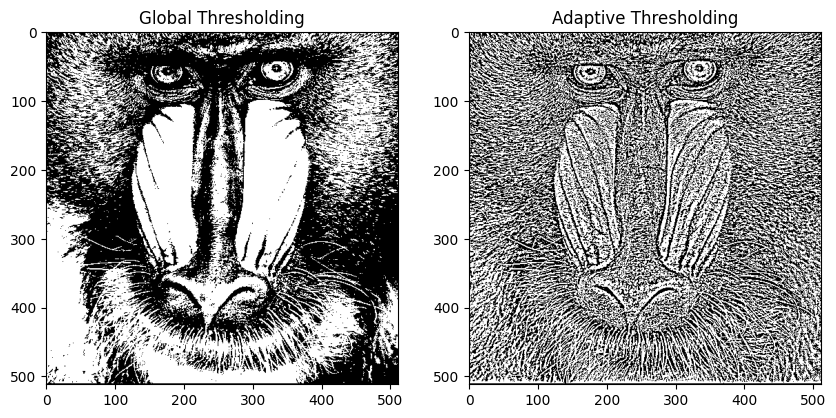

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the image in grayscale
image = cv2.imread('/content/standard-test-images-for-Image-Processing/standard_test_images/baboon.png', cv2.IMREAD_GRAYSCALE)

# Apply global thresholding
_, thresh_global = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# Apply adaptive thresholding
thresh_adaptive = cv2.adaptiveThreshold(image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
                                        cv2.THRESH_BINARY, 11, 2)

# Display results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Global Thresholding")
plt.imshow(thresh_global, cmap='gray')
plt.subplot(1, 2, 2)
plt.title("Adaptive Thresholding")
plt.imshow(thresh_adaptive, cmap='gray')
plt.show()


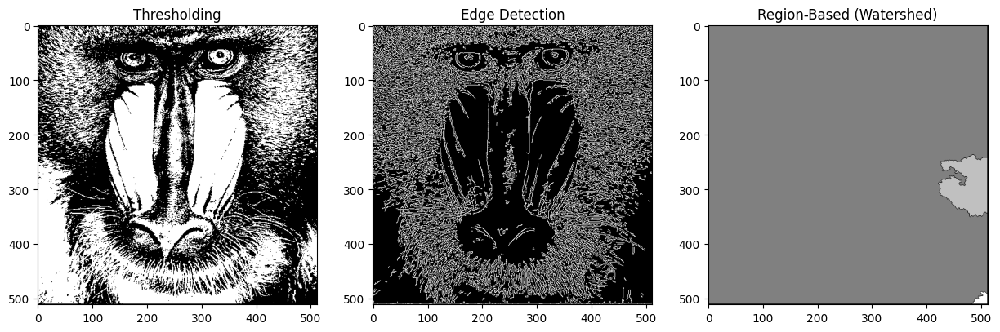

In [ ]:
# Load the image
image = cv2.imread('/content/standard-test-images-for-Image-Processing/standard_test_images/baboon.png', cv2.IMREAD_GRAYSCALE)

# Thresholding
_, thresh_global = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# Edge Detection
edges = cv2.Canny(image, 100, 200)

# Region-based Segmentation (Watershed)
_, binary = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
kernel = np.ones((3, 3), np.uint8)
opening = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=2)
sure_bg = cv2.dilate(opening, kernel, iterations=3)
dist_transform = cv2.distanceTransform(opening, cv2.DIST_L2, 5)
_, sure_fg = cv2.threshold(dist_transform, 0.7 * dist_transform.max(), 255, 0)
sure_fg = np.uint8(sure_fg)
unknown = cv2.subtract(sure_bg, sure_fg)
_, markers = cv2.connectedComponents(sure_fg)
markers = markers + 1
markers[unknown == 255] = 0
markers = cv2.watershed(cv2.cvtColor(image, cv2.COLOR_GRAY2BGR), markers)

# Visualize
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Thresholding")
plt.imshow(thresh_global, cmap='gray')
plt.subplot(1, 3, 2)
plt.title("Edge Detection")
plt.imshow(edges, cmap='gray')
plt.subplot(1, 3, 3)
plt.title("Region-Based (Watershed)")
plt.imshow(markers, cmap='gray')
plt.show()



# Perform erosion, dilation, opening, and closing operations

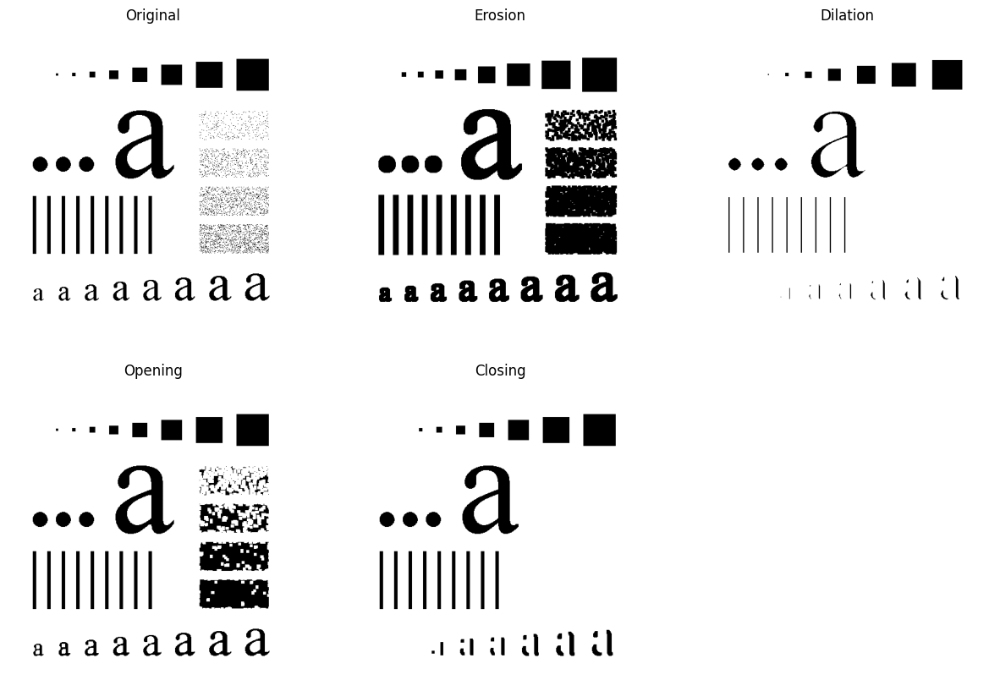

In [ ]:
# Load the image
image = cv2.imread('/content/test_pattern_blurring_orig (1).tif', cv2.IMREAD_GRAYSCALE)

# Apply a binary threshold to convert it into a binary image
_, binary_image = cv2.threshold(image, 127, 255, cv2.THRESH_BINARY)

# Define the kernel
kernel = np.ones((5, 5), np.uint8)  # 5x5 square kernel

# Apply erosion
erosion = cv2.erode(binary_image, kernel, iterations=1)

# Apply dilation
dilation = cv2.dilate(binary_image, kernel, iterations=1)

# Apply opening
opening = cv2.morphologyEx(binary_image, cv2.MORPH_OPEN, kernel)

# Apply closing
closing = cv2.morphologyEx(binary_image, cv2.MORPH_CLOSE, kernel)

# Display all operations together
titles = ['Original', 'Erosion', 'Dilation', 'Opening', 'Closing']
images = [binary_image, erosion, dilation, opening, closing]

plt.figure(figsize=(15, 10))
for i in range(5):
    plt.subplot(2, 3, i+1)
    plt.title(titles[i])
    plt.imshow(images[i], cmap='gray')
    plt.axis('off')
plt.show()



# Implement image registration techniques for aligning multiple images.

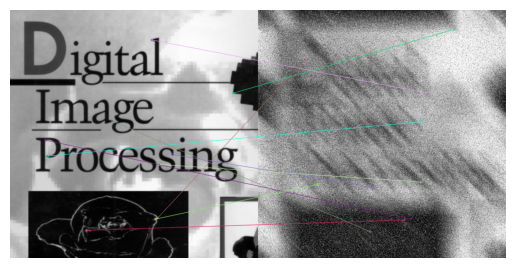

In [ ]:
image1 = cv2.imread('/content/orig_dip.tif', cv2.IMREAD_COLOR)
image2 = cv2.imread('/content/noise_dip.tif', cv2.IMREAD_COLOR)
orb = cv2.ORB_create()
kp1, des1 = orb.detectAndCompute(image1, None)
kp2, des2 = orb.detectAndCompute(image2, None)
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)
image3 = cv2.drawMatches(image1, kp1, image2, kp2, matches[:10], None, flags=2)
plt.imshow(image3)
plt.axis('off')
plt.show()